Garbage Classification

In [6]:
import numpy as np
import pandas as pd
import random
import os
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import sys
import time
import tensorflow.keras as keras
import tensorflow as tf
import re

In [7]:
!pip install tensorflow pillow scikit-learn

# Import necessary libraries
from PIL import Image
from tensorflow.keras.layers import (Input, Conv2D, Dense, Flatten, MaxPooling2D,
                                     GlobalAveragePooling2D, Normalization, Lambda)
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [8]:


# Assuming base_path is the directory where your classes are stored
base_path = "/content/drive/MyDrive/Trash_Classification/Garbage classification"  # Update this to your actual dataset path



In [13]:

# List all categories (folders) in the base_path
categories = [folder for folder in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, folder))]

# List to store filenames and categories
filenames_list = []
categories_list = []

# Collect filenames and corresponding categories
for category in categories:
    category_path = os.path.join(base_path, category)
    filenames = os.listdir(category_path)

    filenames_list += filenames  # Add filenames
    categories_list += [category] * len(filenames)  # Add category for each filename

# Create DataFrame
df = pd.DataFrame({
    'filename': filenames_list,
    'category': categories_list
})

# Add class name prefix to filenames
df = add_class_name_prefix(df, 'filename')

# Shuffle DataFrame
df = df.sample(frac=1).reset_index(drop=True)

# Check the unique categories in the DataFrame
print(df['category'].unique())  # This should show all the categories
print(df['category'].value_counts())  # This will show how many images are in each category


['trash' 'glass' 'cardboard' 'plastic' 'paper' 'metal']
category
paper        604
glass        501
plastic      492
metal        410
cardboard    403
trash        137
Name: count, dtype: int64


In [40]:
# Check the unique categories in the DataFrame
print(df['category'].unique())  # This should show all the categories
print(df['category'].value_counts())

['cardboard' 'paper' 'glass' 'plastic' 'metal' 'trash']
category
paper        604
glass        501
plastic      492
metal        410
cardboard    403
trash        137
Name: count, dtype: int64


In [10]:
import os
import pandas as pd

# Add class name prefix to filename
def add_class_name_prefix(df, col_name):
    df[col_name] = df.apply(lambda row: os.path.join(str(row['category']), row[col_name]), axis=1)
    return df

# List containing all the filenames in the dataset
filenames_list = []
# List to store the corresponding category
categories_list = []

# Assuming categories is a list containing class names like ['paper', 'plastic', etc.]
for category in categories:
    category_path = os.path.join(base_path, str(category))  # Ensure category is treated as string
    filenames = os.listdir(category_path)

    filenames_list += filenames
    categories_list += [str(category)] * len(filenames)  # Ensure category is a string

# Create the DataFrame with filenames and corresponding categories
df = pd.DataFrame({
    'filename': filenames_list,
    'category': categories_list
})

# Add class name prefix to filenames
df = add_class_name_prefix(df, 'filename')

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

# Print number of elements
print('Number of elements =', len(df))


Number of elements = 2547


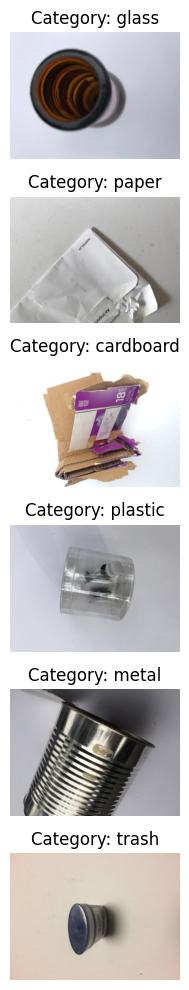

In [11]:
import random
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Function to display a random image from each category
def display_images_by_category(df, base_path):
    categories = df['category'].unique()  # Get all unique categories

    # Set up the plot to display the images
    plt.figure(figsize=(10, 10))

    # Loop over each category
    for i, category in enumerate(categories):
        # Get a random image from the current category
        category_df = df[df['category'] == category]
        random_row = random.randint(0, len(category_df) - 1)
        sample = category_df.iloc[random_row]

        # Load the image
        random_image_path = os.path.join(base_path, sample['filename'])
        img = image.load_img(random_image_path)

        # Add image to the plot
        plt.subplot(len(categories), 1, i+1)  # Create a subplot for each category
        plt.imshow(img)
        plt.title(f"Category: {category}")
        plt.axis('off')

    # Show all the images
    plt.tight_layout()
    plt.show()

# Call the function to display images by category
display_images_by_category(df, base_path)


Sample 1: Category - paper


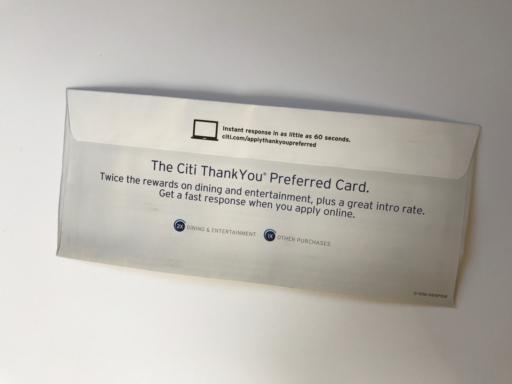

Sample 2: Category - glass


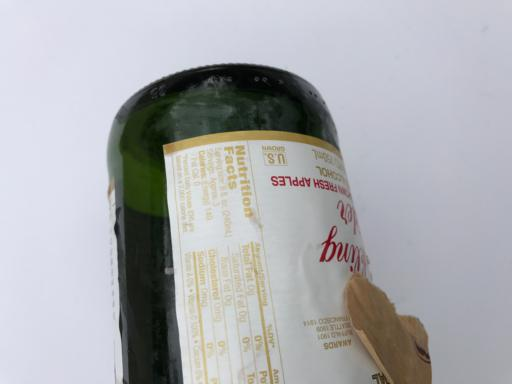

Sample 3: Category - paper


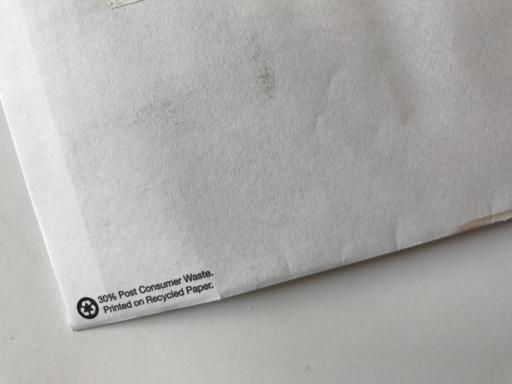

Sample 4: Category - plastic


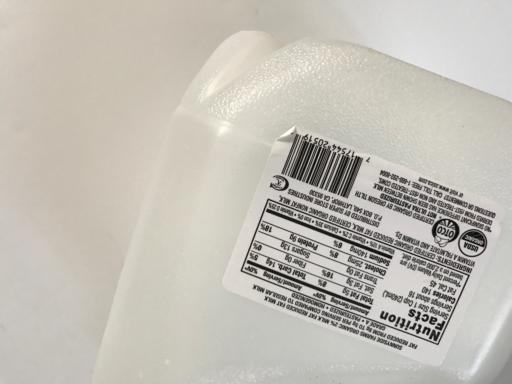

Sample 5: Category - cardboard


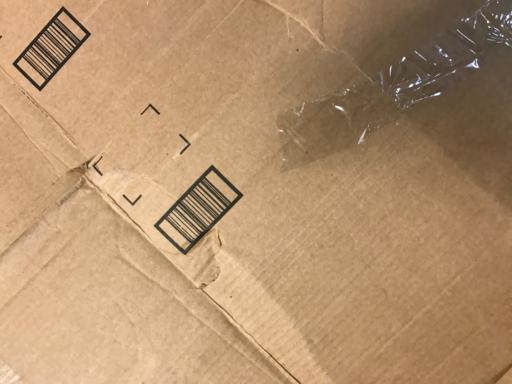

In [23]:
# Display 5 random samples from the dataset
for i in range(5):
    random_row = random.randint(0, len(df) - 1)
    sample = df.iloc[random_row]

    # Construct the full path to the image
    image_path = os.path.join(base_path, sample['filename'])

    # Load the image
    random_image = image.load_img(image_path)

    # Display the image with its category
    print(f"Sample {i+1}: Category - {sample['category']}")
    display(random_image)


Category: trash
Sample 1: Category - trash


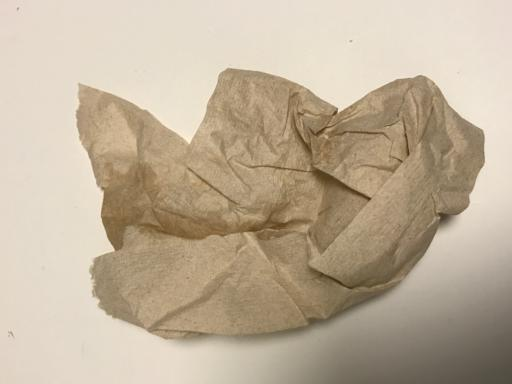

Sample 2: Category - trash


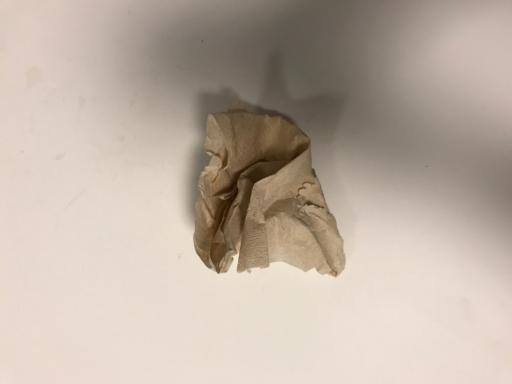

Sample 3: Category - trash


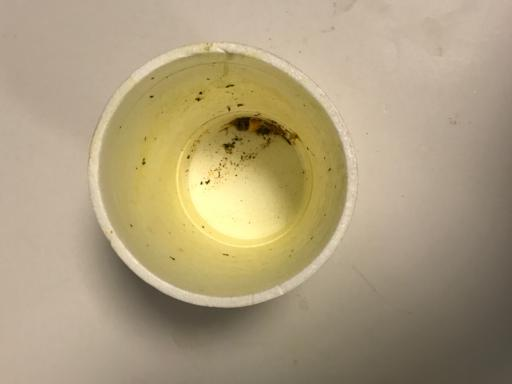

Sample 4: Category - trash


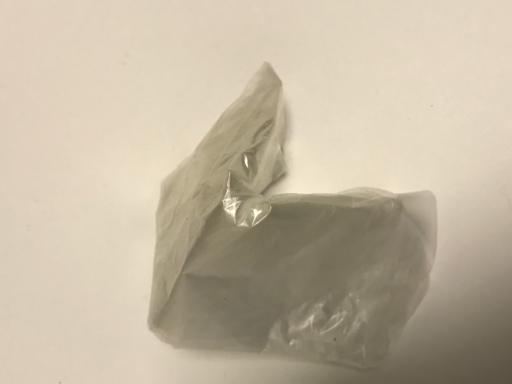

Sample 5: Category - trash


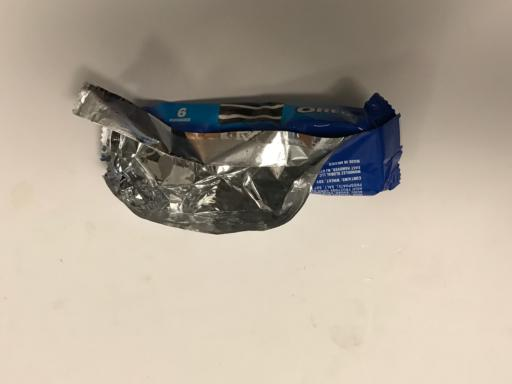

Category: glass
Sample 1: Category - glass


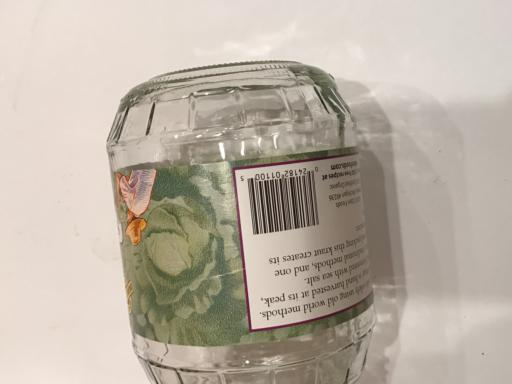

Sample 2: Category - glass


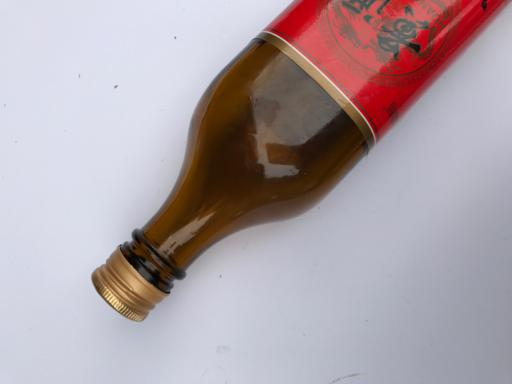

Sample 3: Category - glass


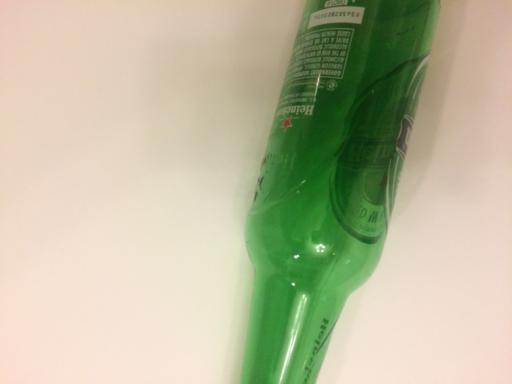

Sample 4: Category - glass


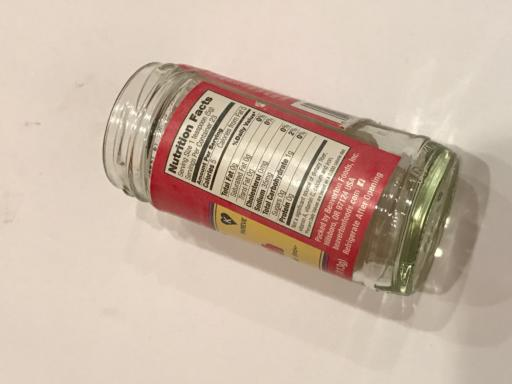

Sample 5: Category - glass


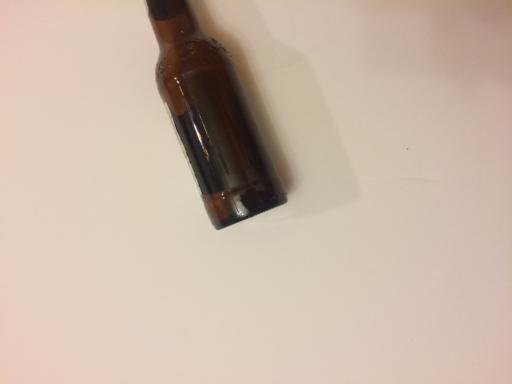

Category: cardboard
Sample 1: Category - cardboard


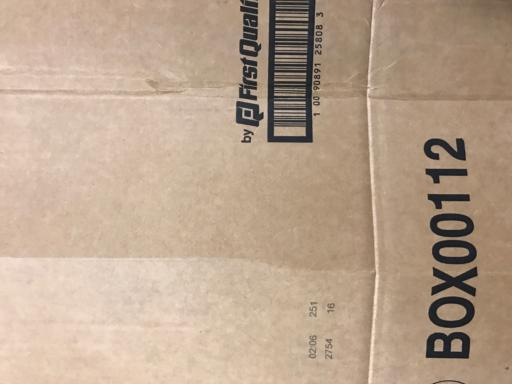

Sample 2: Category - cardboard


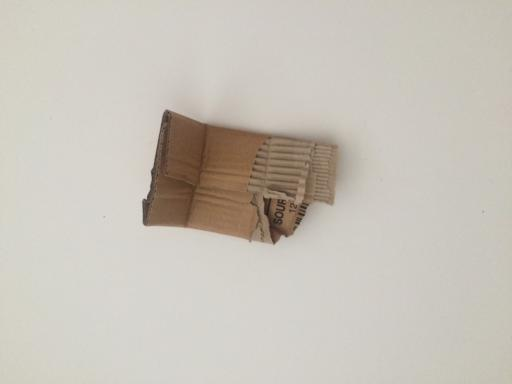

Sample 3: Category - cardboard


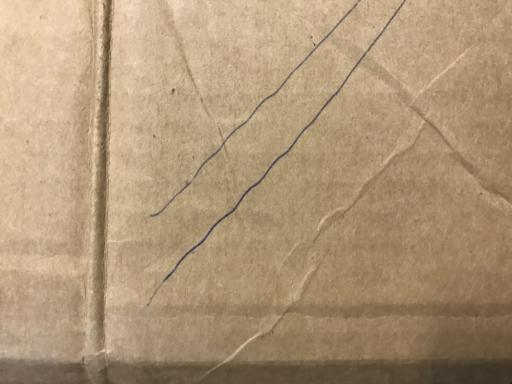

Sample 4: Category - cardboard


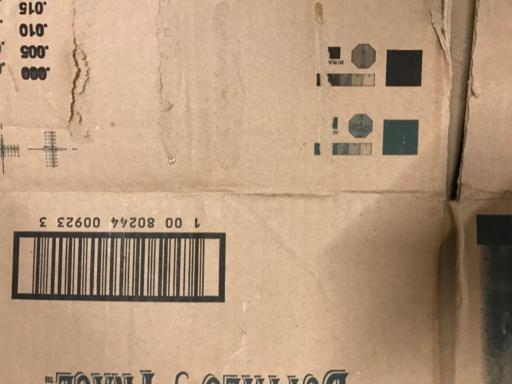

Sample 5: Category - cardboard


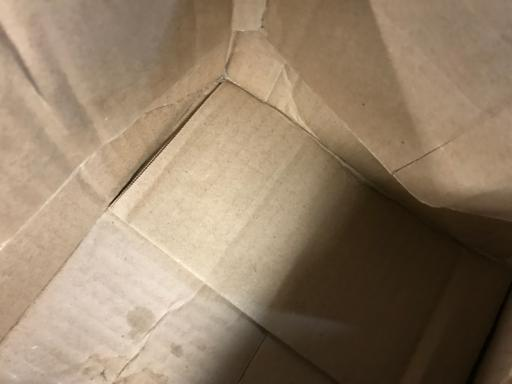

Category: plastic
Sample 1: Category - plastic


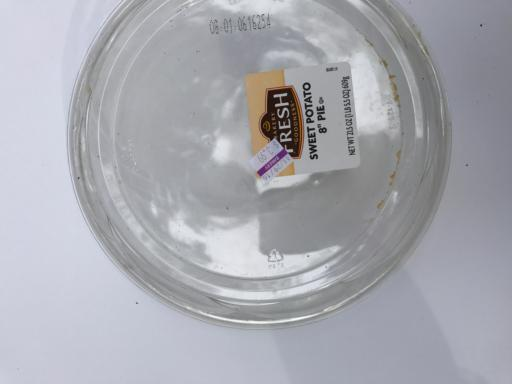

Sample 2: Category - plastic


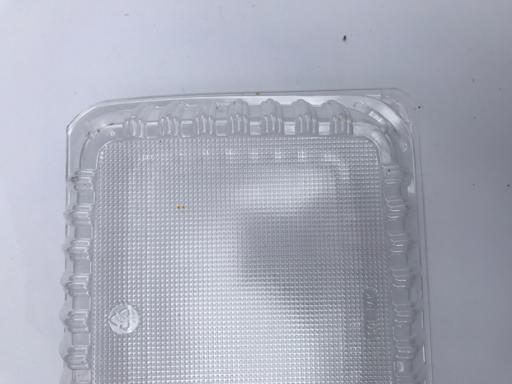

Sample 3: Category - plastic


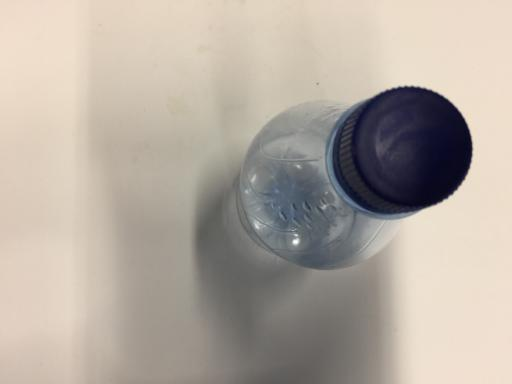

Sample 4: Category - plastic


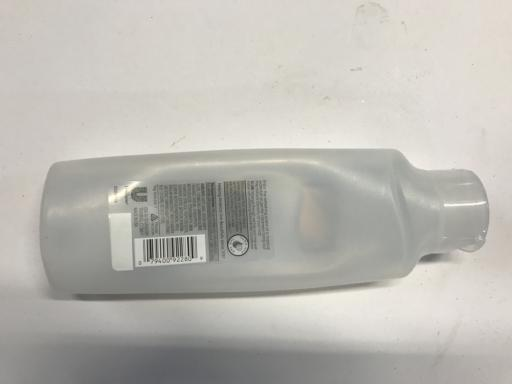

Sample 5: Category - plastic


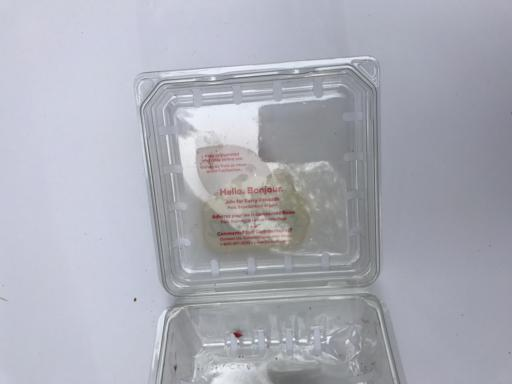

Category: paper
Sample 1: Category - paper


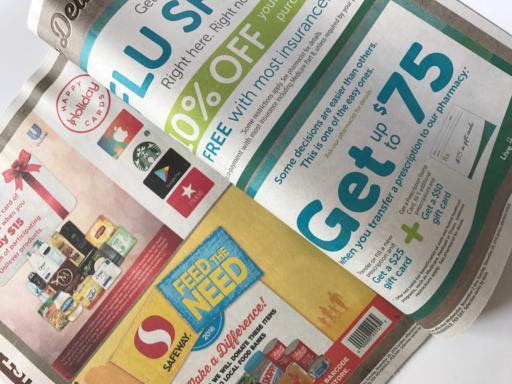

Sample 2: Category - paper


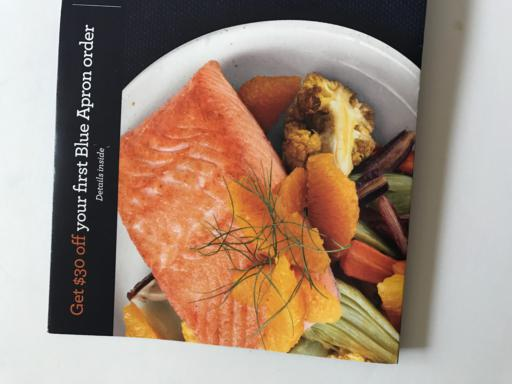

Sample 3: Category - paper


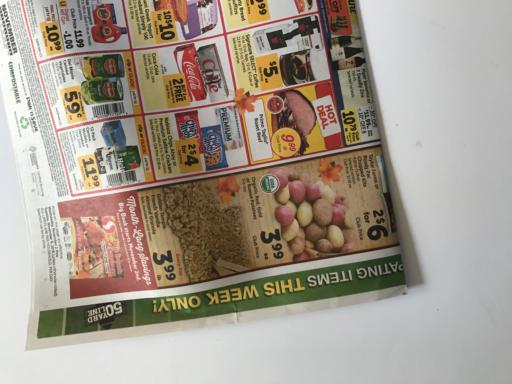

Sample 4: Category - paper


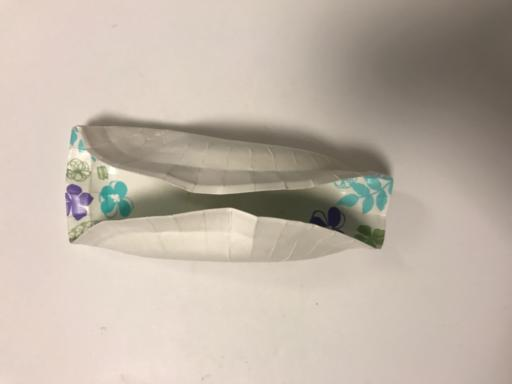

Sample 5: Category - paper


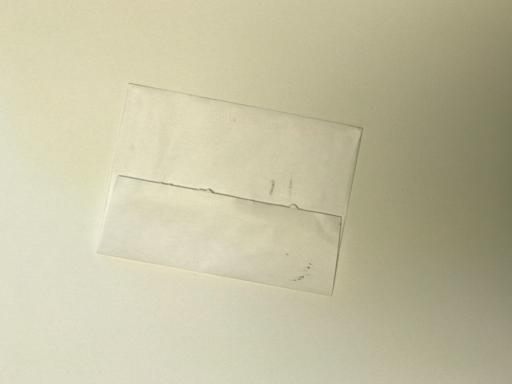

Category: metal
Sample 1: Category - metal


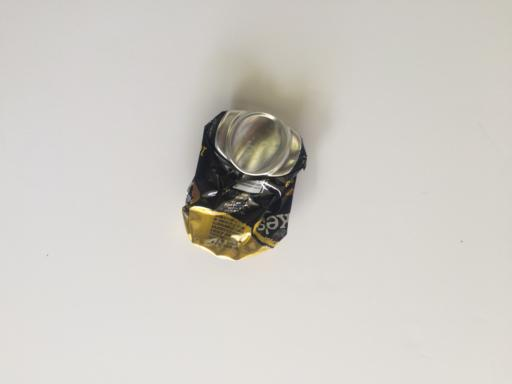

Sample 2: Category - metal


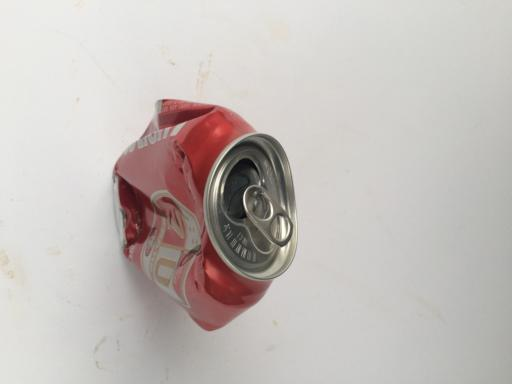

Sample 3: Category - metal


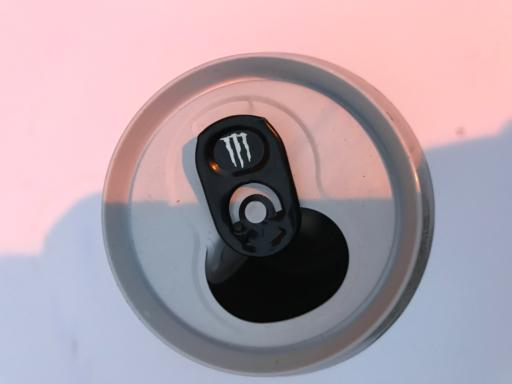

Sample 4: Category - metal


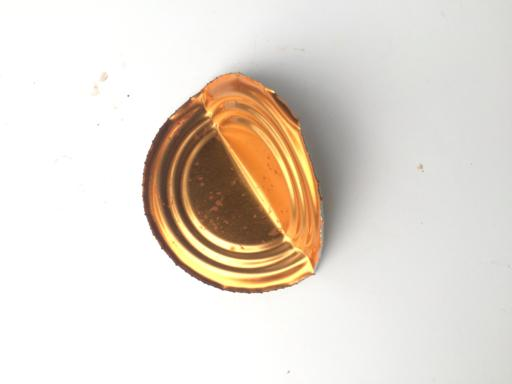

Sample 5: Category - metal


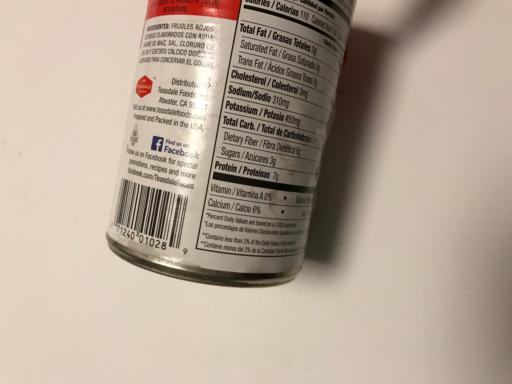

In [24]:

# Assuming df is the dataframe and base_path is defined
categories = df['category'].unique()

# Display 5 random samples from each category
for category in categories:
    print(f"Category: {category}")
    category_samples = df[df['category'] == category]

    for i in range(5):
        random_row = random.randint(0, len(category_samples) - 1)
        sample = category_samples.iloc[random_row]

        # Construct the full path to the image
        image_path = os.path.join(base_path, sample['filename'])

        # Load the image
        random_image = image.load_img(image_path)

        # Display the image with its category
        print(f"Sample {i+1}: Category - {sample['category']}")
        display(random_image)


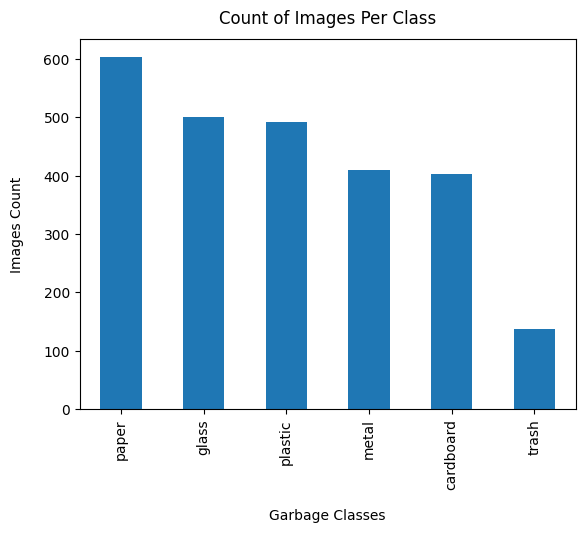

In [12]:
import matplotlib.pyplot as plt

# Create a copy of the dataframe for visualization
df_visualization = df.copy()

# Plot the count of images per class
category_counts = df_visualization['category'].value_counts()

# Plot the bar chart
category_counts.plot(kind='bar')

# Set labels and title
plt.xlabel("Garbage Classes", labelpad=14)
plt.ylabel("Images Count", labelpad=14)
plt.title("Count of Images Per Class", y=1.02)

# Display the plot
plt.show()


In [14]:
# Load MobileNetV2 pre-trained model with weights from ImageNet
base_model = keras.applications.MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to avoid training them
base_model.trainable = False

# Create the model
model = Sequential([
    base_model,  # Add the MobileNetV2 base model
    GlobalAveragePooling2D(),  # Global average pooling
    Dense(1024, activation='relu'),  # Fully connected layer
    Dense(len(categories), activation='softmax')  # Output layer (len(categories) classes)
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Display the model architecture
model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1024)                │       1,311,744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 6)                   │           6,150 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,575,878 (13.64 MB)

 Trainable params: 1,317,894 (5.03 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [15]:
# Function to preprocess image data
def preprocess_image(file_path):
    img = image.load_img(file_path, target_size=(224, 224))  # Resize to (224, 224)
    img_array = image.img_to_array(img)  # Convert image to array
    img_array = keras.applications.mobilenet_v2.preprocess_input(img_array)  # Normalize the image
    return img_array

# Prepare images and labels
X = np.array([preprocess_image(os.path.join(base_path, filename)) for filename in df['filename']])
y = to_categorical(df['category'].map({category: idx for idx, category in enumerate(categories)}))

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32, callbacks=[early_stopping])


Epoch 1/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - accuracy: 0.5868 - loss: 1.2387 - val_accuracy: 0.8314 - val_loss: 0.4848
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 194s 2s/step - accuracy: 0.9049 - loss: 0.2914 - val_accuracy: 0.7902 - val_loss: 0.5673
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.9591 - loss: 0.1530 - val_accuracy: 0.8353 - val_loss: 0.5133
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 187s 2s/step - accuracy: 0.9700 - loss: 0.1061 - val_accuracy: 0.8706 - val_loss: 0.4137
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 180s 2s/step - accuracy: 0.9916 - loss: 0.0514 - val_accuracy: 0.8627 - val_loss: 0.4201
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 157s 2s/step - accuracy: 0.9980 - loss: 0.0303 - val_accuracy: 0.8529 - val_loss: 0.4917
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 199s 2s/step - accuracy: 0.9992 - loss: 0.0165 - val_accuracy: 0.8765 - val_loss: 0.4408


In [16]:
# Evaluate the model on the validation set
val_loss, val_acc = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_acc}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.8778 - loss: 0.3664
Validation Loss: 0.41368839144706726
Validation Accuracy: 0.8705882430076599


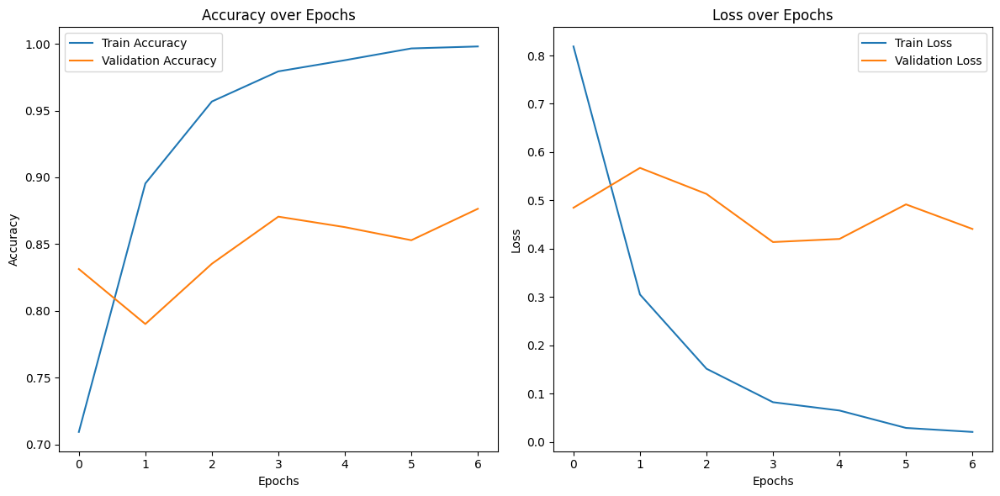

In [18]:
# Visualization of training and validation accuracy/loss
# Plot accuracy
plt.figure(figsize=(12, 6))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [17]:
# Predict on validation set and display classification report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_val, axis=1)

print(classification_report(y_true_classes, y_pred_classes, target_names=categories))


16/16 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step
              precision    recall  f1-score   support

       paper       0.86      0.90      0.88       119
     plastic       0.89      0.84      0.86        97
       trash       0.61      0.71      0.66        35
       metal       0.92      0.88      0.90        81
       glass       0.88      0.92      0.90        92
   cardboard       0.94      0.87      0.90        86

    accuracy                           0.87       510
   macro avg       0.85      0.85      0.85       510
weighted avg       0.88      0.87      0.87       510



In [19]:
# Testing on a single image
def test_single_image(image_path):
    img = image.load_img(image_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = keras.applications.mobilenet_v2.preprocess_input(img_array)

    prediction = model.predict(img_array)
    predicted_class = categories[np.argmax(prediction)]
    print(f"Predicted Class: {predicted_class}")

# Test on a sample image (replace the path with a valid image path)
test_image_path = "/content/drive/MyDrive/Trash_Classification/Garbage classification/plastic/plastic102.jpg"  # Update with the path to your image
test_single_image(test_image_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Predicted Class: plastic


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


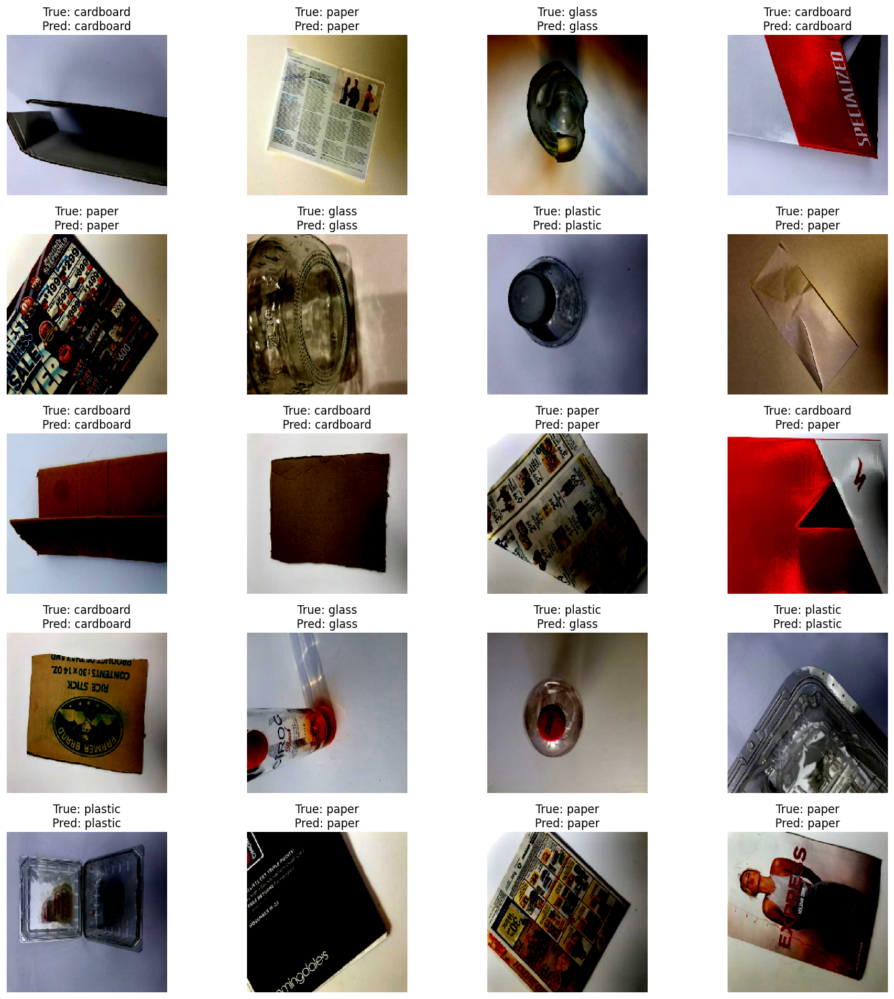

Accuracy on random 20 images: 90.00%


In [20]:
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from sklearn.metrics import accuracy_score

# Function to test random 20 images from the validation set
def test_random_images(X_val, y_val, model, categories, num_images=20):
    # Select 20 random indices from the validation set
    random_indices = random.sample(range(len(X_val)), num_images)

    # Store true and predicted labels
    true_labels = []
    predicted_labels = []

    # Set up a plot to display the images
    plt.figure(figsize=(15, 15))

    for i, idx in enumerate(random_indices):
        # Get the image and the true label
        img = X_val[idx]
        true_label = np.argmax(y_val[idx])

        # Predict the class for the image
        img = np.expand_dims(img, axis=0)  # Add batch dimension
        prediction = model.predict(img)
        predicted_label = np.argmax(prediction)

        # Append true and predicted labels
        true_labels.append(true_label)
        predicted_labels.append(predicted_label)

        # Display the image
        plt.subplot(5, 4, i+1)  # Display images in a 5x4 grid
        plt.imshow(img[0])  # Remove batch dimension to display the image
        plt.title(f"True: {categories[true_label]}\nPred: {categories[predicted_label]}")
        plt.axis('off')

    # Show the plot
    plt.tight_layout()
    plt.show()

    # Calculate accuracy
    accuracy = accuracy_score(true_labels, predicted_labels)
    print(f"Accuracy on random 20 images: {accuracy * 100:.2f}%")

# Call the function to test random 20 images
test_random_images(X_val, y_val, model, categories, num_images=20)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
Predicted class: metal


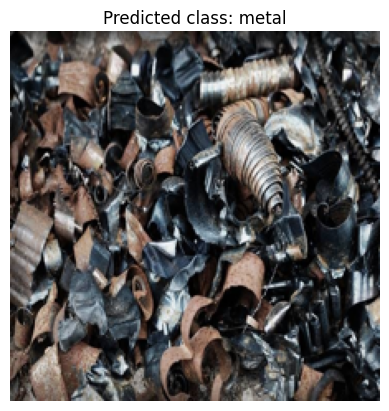

In [22]:
import requests
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from io import BytesIO
import matplotlib.pyplot as plt

# Image URL
img_url = "https://budgetskips.com/wp-content/uploads/2021/12/New-Metals-min.jpg"

# Step 1: Download the image
response = requests.get(img_url)
img = Image.open(BytesIO(response.content))

# Step 2: Preprocess the image for MobileNetV2
img_resized = img.resize((IMAGE_WIDTH, IMAGE_HEIGHT))  # Resize to model input size
img_array = image.img_to_array(img_resized)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array = mobilenetv2.preprocess_input(img_array)  # Preprocess for MobileNetV2

# Step 3: Run the model on the image
prediction = model.predict(img_array)

# Step 4: Get predicted class
predicted_class = categories[np.argmax(prediction)]
print(f"Predicted class: {predicted_class}")

# Step 5: Display the image along with the prediction
plt.imshow(img_resized)
plt.axis('off')  # Hide axes
plt.title(f"Predicted class: {predicted_class}")
plt.show()


16/16 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step


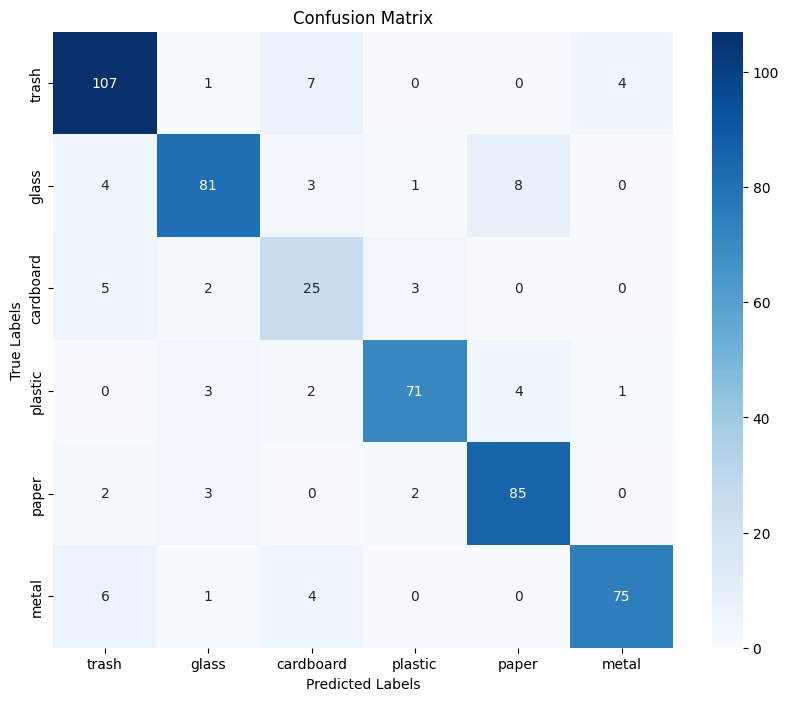

In [26]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, categories):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

# Predict on the entire validation set
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels

# Calculate confusion matrix
plot_confusion_matrix(np.argmax(y_val, axis=1), y_pred_classes, categories)


In [27]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(np.argmax(y_val, axis=1), y_pred_classes, target_names=categories)
print("Classification Report:\n", report)


Classification Report:
               precision    recall  f1-score   support

       trash       0.86      0.90      0.88       119
       glass       0.89      0.84      0.86        97
   cardboard       0.61      0.71      0.66        35
     plastic       0.92      0.88      0.90        81
       paper       0.88      0.92      0.90        92
       metal       0.94      0.87      0.90        86

    accuracy                           0.87       510
   macro avg       0.85      0.85      0.85       510
weighted avg       0.88      0.87      0.87       510



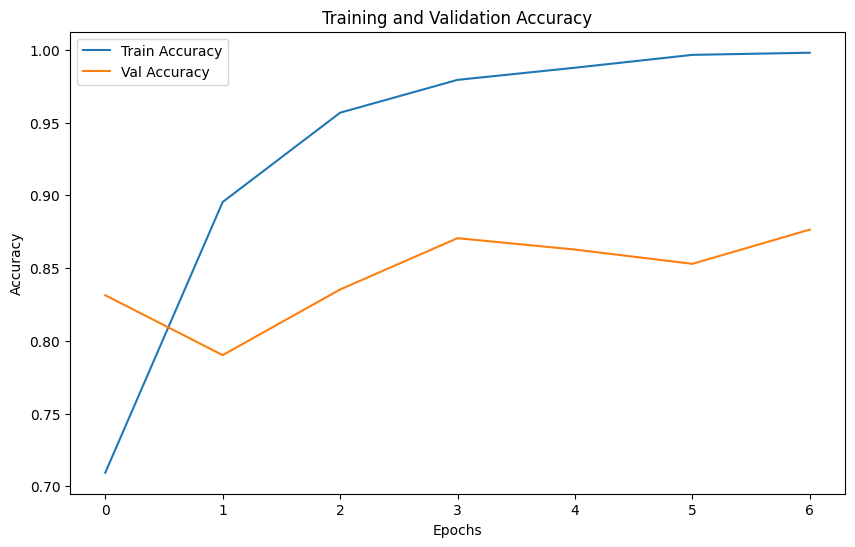

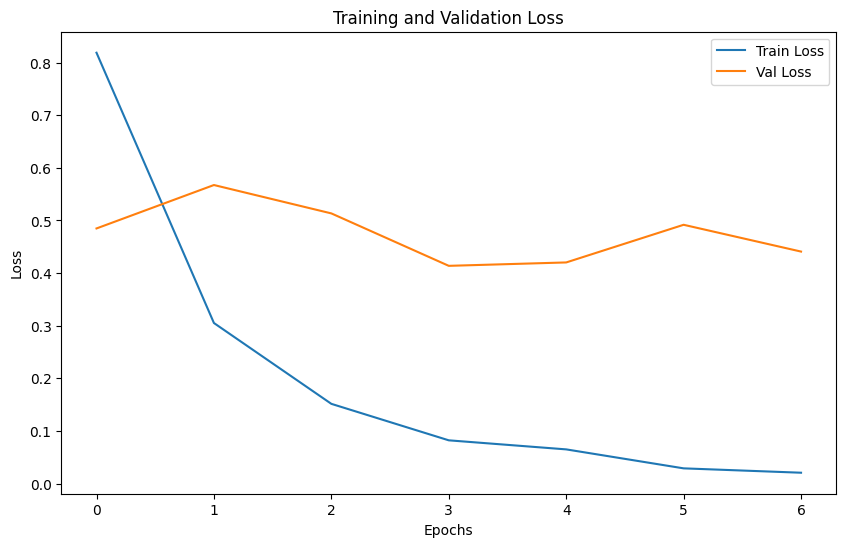

In [28]:
# Plot the training history (loss and accuracy)
def plot_training_history(history):
    # Plot the training and validation accuracy
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.show()

    # Plot the training and validation loss
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

# Assuming 'history' is the history object returned by model.fit()
plot_training_history(history)


16/16 ━━━━━━━━━━━━━━━━━━━━ 47s 3s/step


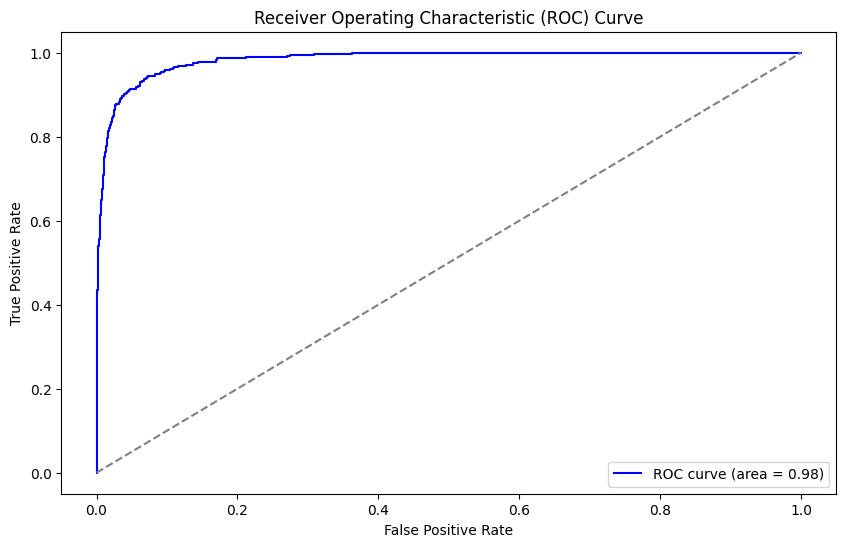

In [29]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the labels
y_val_bin = label_binarize(np.argmax(y_val, axis=1), classes=np.arange(len(categories)))
y_pred_bin = model.predict(X_val)

# Calculate ROC curve and AUC
fpr, tpr, _ = roc_curve(y_val_bin.ravel(), y_pred_bin.ravel())
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='b', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [31]:
import time

# Measure inference time
def measure_inference_time(model, img):
    start_time = time.time()
    model.predict(img)
    end_time = time.time()

    print(f"Inference time for one image: {end_time - start_time:.4f} seconds")

# Test inference time on a random image
random_idx = random.randint(0, len(X_val) - 1)
img = np.expand_dims(X_val[random_idx], axis=0)  # Add batch dimension
measure_inference_time(model, img)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
Inference time for one image: 0.3291 seconds


In [32]:
# Save the model
model.save("garbage_classification_model.h5")

# Load the model
loaded_model = tf.keras.models.load_model("garbage_classification_model.h5")
